In [1]:
import os
def ConnectToDataFolder(FolderPath):
    print("=" * 80, "- Begin: ConnectToDataFolder")
  
    if (os.path.isdir(FolderPath)):
        os.chdir(FolderPath)
        print("List of Data in the Folder :")
        display(os.listdir())
    else:
        print(f"{FolderPath} is not correct, please check the folder again")
  
    print("=" * 80, "- Finish: ConnectToDataFolder")

In [2]:
def GetSubFiles(dir, ExtensionList = []):
    print("=" * 80, "- Begin: GetSubFiles")

    "Get a list of immediate subfiles"
    all_names = next(os.walk(dir))[2]
    subfile_names = []
    if(len(ExtensionList) > 0):
        for filename in all_names:
            fname, fextension = os.path.splitext(filename)
            if any(ext in fextension for ext in ExtensionList):
                subfile_names.append(dir + "/" + filename)
    else:
        subfile_names = [dir + "/" + x for x in all_names]
    
    print(f"There are {len(subfile_names)} files are found")
    subfile_names.sort()
    print("Here is some samples :")
    [print(x) for x in subfile_names[0: min(len(subfile_names), 5)]]

    print("=" * 80, "- End: GetSubFiles")
    return subfile_names

In [3]:
from matplotlib import pyplot as plt 
import matplotlib.gridspec as gridspec

def ShowImage(ImageList, nRows = 1, nCols = 2, ImageTitleList = []):    
    gs = gridspec.GridSpec(nRows, nCols)     
    plt.figure(figsize=(20,20))
    for i in range(len(ImageList)):
        ax = plt.subplot(gs[i])
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')

        plt.subplot(nRows, nCols,i+1)

        image = ImageList[i].copy()
        if (len(image.shape) < 3):
            plt.imshow(image, plt.cm.gray)
        else:
            plt.imshow(image)
        if(len(ImageTitleList)  > 0):
            plt.title("Image " + str(ImageTitleList[i]))
        else:
            plt.title("Image " + str(i))

        plt.axis('off')

    plt.show()

In [4]:
import random
from pylab import imread

def ShowRandomImage(DatasetFiles, nRows = 1, nCols = 5, seedNo = 10):
    print("=" * 80, "- Begin: ShowRandomImage")

    nFile = nRows * nCols

    random.seed(seedNo)
    FileNameList = random.sample(DatasetFiles, nFile)
    ImageList = []
    for filepath in FileNameList:
        image_RGB = imread(filepath)
        ImageList.append(image_RGB)
  
    ShowImage(ImageList, nRows, nCols, FileNameList)

    print("=" * 80, "- Finish: ShowRandomImage")
    return FileNameList, ImageList

In [5]:
from skimage.transform import rescale, resize
import cv2 
 
def ResizeImage(image, wresize = 0, hresize = 0):
    OrigWidth, OrigHeight = float(image.shape[1]), float(image.shape[0])

    if((wresize == 0) & (hresize == 0)):
        return image
    if(wresize == 0):
        wresize = int((OrigWidth * hresize)/OrigHeight)
    if(hresize == 0):
        hresize = int((OrigHeight * wresize)/OrigWidth)
    resize_image = cv2.resize(image, (wresize, hresize), interpolation = cv2.INTER_NEAREST) 
    return resize_image

In [6]:
def ConvertColorSpaces(image, ColorSpace = "GRAY", display = 1):
    ImageTitleList = ["RGB", ColorSpace]

    if(ColorSpace.upper() == "HSV"):
        image_convert = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        ChannelList = ["Chrominance Hue" , "Chrominance Saturation", "Luminance Value"]
    elif(ColorSpace.upper() == "YCRCB"):
        image_convert = cv2.cvtColor(image, cv2.COLOR_BGR2YCR_CB)
        ChannelList = ["Chrominance Red" , "Chrominance Blue", "Luminance Y"]
    elif(ColorSpace.upper() == "LAB"):
        image_convert = cv2.cvtColor(image, cv2.COLOR_RGB2YCR_CB)
        ChannelList = ["Chrominance a(Green To Red)" , "Chrominance b(Blue To Yellow)", "Luminance L"]
    else:
        image_convert = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    if(display):
        if(len(image_convert.shape) == 3):  
            ShowImage([image, image_convert, image_convert[:,:,0], image_convert[:,:,1], image_convert[:,:,2]], 1, 5, 
                ImageTitleList + ChannelList)
        else:
            ShowImage([image, image_convert], 1, 5, ImageTitleList)

    return image_convert

In [9]:
import matplotlib.pyplot as plt
from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)

def ShowHistogram(image, Title = "Color Histogram", ChannelList = ["Channel 1", "Channel 2", "Channel 3"]):
    fig, ax = plt.subplots(figsize=(20, 10))

    if(len(image.shape) == 3):
        color = ('r', 'g', 'b')
        for channel,col in enumerate(color):
            histr = cv2.calcHist([image],[channel],None,[256],[0,256])
            ax.plot(histr,color = col, label = ChannelList[channel])
        
        plt.title(Title)
        plt.legend()
    else:
        histr = cv2.calcHist([image],[0],None,[256],[0,256])
        plt.plot(histr,color = "gray", label = "Gray")
        plt.title("Gray Histogram")
        plt.legend()

  # Set axis ranges; by default this will put major ticks every 25.
    ax.set_xlim(0, 255)

  # Change major ticks to show every 20.
    ax.xaxis.set_major_locator(MultipleLocator(20))

  # Change minor ticks to show every 5. (20/4 = 5)
    ax.xaxis.set_minor_locator(AutoMinorLocator(4))

  # Turn grid on for both major and minor ticks and style minor slightly
  # differently.
    ax.grid(which='major', color='#CCCCCC', linestyle='--')
    ax.grid(which='minor', color='#CCCCCC', linestyle=':')
    plt.show()

In [10]:
import numpy as np

def SegmentByThresh(image, channel, segment_range = [], display = 1):
    if(len(segment_range) == 0):
        thresh, image_mask = cv2.threshold(channel,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
        print(f"Otsu Threshold : {thresh}")
    else:
        image_mask = ((channel > segment_range[0]) & (channel < segment_range[1]))

    image_segment = cv2.bitwise_and(image, image, mask = image_mask.astype(np.uint8))

    ImageTitleList = ["Color Image", "Segmented Channel", "Segmented Mask", "Segmented Color Image"]
    if(display):
        ShowImage([image, channel, image_mask, image_segment], 1, 5, ImageTitleList)

    image_mask = image_mask.astype(bool)
    return image_mask

In [11]:
import skimage
from skimage import measure

def GetLargestBinaryArea(image, image_mask, display = 1):
    labels_mask = measure.label(image_mask)                       
    regions = measure.regionprops(labels_mask)
    regions.sort(key=lambda x: x.area, reverse=True)
    if len(regions) > 1:
        for rg in regions[1:]:
            labels_mask[rg.coords[:,0], rg.coords[:,1]] = 0
    labels_mask[labels_mask!=0] = 1
    image_mask = labels_mask
  
    image_segment = cv2.bitwise_and(image, image, mask = image_mask.astype(np.uint8))
    ImageTitleList = ["Color Image", "Segmented Mask", "Segmented Color Image"]
  
    if(display):
        ShowImage([image, image_mask, image_segment], 1, 5, ImageTitleList)

    return image_mask

In [12]:
from skimage.measure import label, regionprops
from skimage.segmentation import mark_boundaries

def LabelObjectByMask(image_input, image_mask, type = "BBox", color = (0,255,0)):
    image_output = image_input.copy()

    Marker_Size = int(AnImage.shape[0] * 0.1)
    Marker_Thick = int(AnImage.shape[0] * 0.01)
    BBoxThick = int(AnImage.shape[0] * 0.01)
    ContourThick = int(AnImage.shape[0] * 0.01)

    label_img = label(image_mask)
    regions = regionprops(label_img)
    for props in regions:
        minr, minc, maxr, maxc = props.bbox
        left_top = (minc, minr)
        right_bottom = (maxc, maxr)
        at_row, at_col = props.centroid

        if(type == "BBox"):
            cv2.rectangle(image_output,left_top, right_bottom, color ,BBoxThick)

        if(type == "Boundary"):
            contours, heirarchy = cv2.findContours(image_mask.astype(np.uint8), cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
            cv2.drawContours(image_output, contours, -1, color, ContourThick)
            cv2.drawMarker(image_output, (int(at_col), int(at_row)),color, markerType=cv2.MARKER_STAR, 
                           markerSize= Marker_Size, thickness= Marker_Thick, line_type=cv2.LINE_AA)
          
        if(type == "Fill"):
            image_output[image_mask > 0] = color
            
    return image_output

In [13]:
def IntensityTransformation(image, gamma = 0.3, display = 1):
    image_gamma_corrected = np.array(255*(image / 255) ** gamma, dtype = 'uint8')
    ShowImage([image, image_gamma_corrected], 1, 5, ["Original Image", f"Gamma = {gamma}"])
    if(display):
        GammaImageList = []
        TitleList = []
  
    for g in [0.3, 0.5, 0.9,  1.2, 2.2]:
      # Apply gamma correction.
        gamma_corrected = np.array(255*(image / 255) ** g, dtype = 'uint8')
        GammaImageList.append(gamma_corrected)
        TitleList.append(f"Gamma = {g}")

    ShowImage(GammaImageList, 1, 5, TitleList)
    return image_gamma_corrected

In [29]:
from skimage.morphology import (erosion, dilation, opening, closing, white_tophat)
from skimage.morphology import black_tophat, skeletonize, convex_hull_image  
from skimage.morphology import disk
from scipy import ndimage

# Morphology 
def Morphology(image, image_mask, morType = "erosion", size = 3, display = 1):
    image_mask = image_mask.astype(np.uint8)
    kernel = disk(abs(size))

    if(morType == "erosion"):
        result = erosion(image_mask, kernel) # phóng to
    if(morType == "dilation"):
        result = dilation(image_mask, kernel) # thu nhỏ
    if(morType == "opening"):
        result = opening(image_mask, kernel)
    if(morType == "closing"):
        result = closing(image_mask, kernel)
    if(morType == "gradient"):
        result = cv2.morphologyEx(image_mask, cv2.MORPH_GRADIENT, kernel) # tính đạo hàm
    if(morType == "tophat"):
        result = white_tophat(image_mask, kernel) # tính điểm sáng nhất
    if(morType == "blackhat"):
        result = black_tophat(image_mask, kernel) # tính điểm tối nhất
    if(morType == "fillhole"):
        result = ndimage.binary_fill_holes(image_mask).astype(int)
    if(morType == "skeleton"):
        result = skeletonize(image_mask == 1) # tính khung xương
    if(morType == "convexhull"):
        result = convex_hull_image(image_mask == 1)

    if(display):
        image_mask_color = cv2.bitwise_and(image, image, mask = result.astype(np.uint8))

        im_erosion = erosion(image_mask, kernel)
        im_dilation = dilation(image_mask, kernel)
        im_opening = opening(image_mask, kernel)
        im_closing = closing(image_mask, kernel)
        im_gradient = cv2.morphologyEx(image_mask, cv2.MORPH_GRADIENT, kernel)
        im_tophat = white_tophat(image_mask, kernel)
        im_blackhat = black_tophat(image_mask, kernel)
        im_fillhole = ndimage.binary_fill_holes(image_mask).astype(int)
        im_skeleton = skeletonize(image_mask == 1)
        im_convexhull = convex_hull_image(image_mask == 1)

        ShowImage([image, result, image_mask_color], 1, 5, ImageTitleList= ["Color Image", "Mask", "Segment By Mask"])
        ShowImage([im_erosion, im_dilation, im_opening, im_closing, im_gradient], 1, 5, 
              ImageTitleList= ["Erosion", "Dilation", "Opening", "Closing", "Gradient"])
        ShowImage([im_tophat, im_blackhat, im_fillhole, im_skeleton, im_convexhull], 1, 5, 
              ImageTitleList= ["Tophat", "BlackHat", "FillHole", "Skeleton", "Convexhull"])
    
    result = result.astype(bool)
    return result

In [15]:
import numpy as np
def ConcatImage(ImageList, CombineType = "h", display = 1):
    if(CombineType == "h"):
        result = np.concatenate(ImageList, axis=1)
    else:
        result = np.concatenate(ImageList, axis=0)
  
    if(display):
        ShowImage([result], 1, 1)

    result = np.uint8(result)
    return result

In [16]:
from pathlib import Path
    
def GenerateOutput(image, image_mask, FilePath = "", SaveFolderPath = ""):
    # giả lập thành 3 kênh màu rgb mới lưu xuống được
    image_output_rgbmask = cv2.merge([image_mask*255, image_mask*255, image_mask*255])
    image_output_fill = LabelObjectByMask(image, image_mask, type = "Fill", color = (255,0,0))
    image_output_bbox = LabelObjectByMask(image, image_mask, type = "BBox", color = (255,0,0))
    image_output_boundary = LabelObjectByMask(image, image_mask, type = "Boundary", color = (255,0,0))

    DemoImage1 = ConcatImage([image_output_rgbmask, image_output_fill], display= 0)
    DemoImage2 = ConcatImage([image_output_bbox, image_output_boundary], display= 0)
    DemoImage = ConcatImage([DemoImage1, DemoImage2], CombineType = "v", display= 0)

    if(len(FolderPath) > 0):
        filename = Path(FilePath).stem
        print(f"Already Save Results to Folder {SaveFolderPath}")
    
        print(f'{SaveFolderPath}/{filename}_rgbmask.jpg')
        cv2.imwrite(f'{SaveFolderPath}/{filename}_mask.jpg', image_output_rgbmask)

        print(f'{SaveFolderPath}/{filename}_demo.jpg')
        cv2.imwrite(f'{SaveFolderPath}/{filename}_demo.jpg', cv2.cvtColor(DemoImage, cv2.COLOR_RGB2BGR))

    return image_output_rgbmask, image_output_fill, image_output_bbox, image_output_boundary, DemoImage

In [17]:
def doCoconutMaskSegment(AnImage, image_mask, display = 1):
    MaskList = []
    MaskList.append(image_mask)
    image_mask_adjust = Morphology(AnImage, image_mask, morType = "fillhole", size = 8, display = 0)
    MaskList.append(image_mask_byauto)
    image_mask_adjust = Morphology(AnImage, image_mask_adjust, morType = "erosion", size = 8, display = 0)
    MaskList.append(image_mask_adjust)
    image_mask_adjust = GetLargestBinaryArea(AnImage, image_mask_adjust, display = 0)
    MaskList.append(image_mask_adjust)
    image_mask_adjust = Morphology(AnImage, image_mask_adjust, morType = "dilation", size = 10, display = 0)
    MaskList.append(image_mask_adjust)
  
    if(display):
        ShowImage(MaskList, 1, 5)
  
    return image_mask_adjust

In [18]:
def doCoconutMaskSegment2(AnImage, image_mask, display = 1):
    MaskList = []
    MaskList.append(image_mask)
    image_mask_adjust = Morphology(AnImage, image_mask, morType = "fillhole", size = 8, display = 0)
    MaskList.append(image_mask_adjust)
    image_mask_adjust = Morphology(AnImage, image_mask_adjust, morType = "erosion", size = 50, display = 0)
    MaskList.append(image_mask_adjust)
    image_mask_adjust = GetLargestBinaryArea(AnImage, image_mask_adjust, display = 0)
    MaskList.append(image_mask_adjust)
    image_mask_adjust = Morphology(AnImage, image_mask_adjust, morType = "dilation", size = 50, display = 0)
    MaskList.append(image_mask_adjust)
  
    if(display):
        ShowImage(MaskList, 1, 5)
  
    return image_mask_adjust

In [63]:
from skimage.measure import label, regionprops
# đặt trưng về trung tâm, biên
def GetContourCenter(image, image_mask, display = 1):
    # đánh nhãn vung lớn nhất
    image_label = label(GetLargestBinaryArea(image, image_mask, display = 0)) 
    # lấy thông tin
    regions = regionprops(image_label, intensity_image= image_mask)
    props = regions[0]
    (center_y, center_x) =  props.centroid
    CenterPoints = [int(center_x), int(center_y)]

    # lấy danh sách điểm biên
    contours, hierarchy = cv2.findContours(image_mask.astype(np.uint8), cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
    ContourPoints = np.squeeze(contours[0], axis=1)

    if(display):
        print(f"Center Point at X = {CenterPoints[0]} and Y = {CenterPoints[1]}")
        print(f"Contours Points are \n {ContourPoints}")

        image_demo = image.copy()
        cv2.drawMarker(image_demo, (CenterPoints[0], CenterPoints[1]),(255,255,0), 
                   markerType=cv2.MARKER_STAR, markerSize=25, thickness=2, line_type=cv2.LINE_AA)
    
        count = 0
        for x_idx, y_idx in ContourPoints:
            count = count + 1
            if(count % 15 == 0):
                cv2.drawMarker(image_demo, (x_idx, y_idx),(255,0,0), 
                    markerType=cv2.MARKER_STAR, markerSize=10, thickness=2, line_type=cv2.LINE_AA)
      
            ShowImage([image_mask, image_demo], 1, 5)
    return CenterPoints, ContourPoints

In [59]:
import math
# return bán kính ngang, dọc của hình clip bao bọc mask
# có thể giúp lấy ra được chiều ngang và chiều dọc, thể tích đối tượng
def GetMinorMajorLength(image, image_mask, display = 1):
    image_label = label(GetLargestBinaryArea(image, image_mask, display = 0)) 
    regions = regionprops(image_label, intensity_image= image_mask)
    props = regions[0]

    minorLength = props.minor_axis_length
    majorLength = props.major_axis_length
    orientation = props.orientation # hướng của elip
    minr, minc, maxr, maxc = props.bbox
    bbox = [minr, minc, maxr, maxc] 

    if(display):
        print(f"Minor Length = {minorLength} and Major Length = {majorLength} and Orientation = {orientation}")
        print(f"Bounding Box minr, minc, maxr, maxc are : {bbox}")
        y0, x0 = props.centroid
        x1 = int(x0 + math.cos(orientation) * 0.5 * minorLength)
        y1 = int(y0 - math.sin(orientation) * 0.5 * minorLength)
        x2 = int(x0 - math.sin(orientation) * 0.5 * majorLength)
        y2 = int(y0 - math.cos(orientation) * 0.5 * majorLength)
        x0 = int(x0)
        y0 = int(y0)  
    
        image_demo = image.copy()
        cv2.line(image_demo, (x0, y0), (x1, y1), (0, 255, 0), thickness=3)
        cv2.line(image_demo, (x0, y0), (x2, y2), (0, 255, 0), thickness=3)
  
        ShowImage([image_mask, image_demo], 1, 5)
    return minorLength, majorLength, orientation, bbox

In [36]:
# return diện tích, chu vi
def GetAreaPerimeterSolidity(image, image_mask, display = 1):
    image_label = label(GetLargestBinaryArea(image, image_mask, display = 0)) 
    regions = regionprops(image_label, intensity_image= image_mask)
    props = regions[0]

    Area = int(props.area)
    Perimeter = int(props.perimeter)
    # Ratio of pixels in the region to pixels of the convex hull image.
    Solidity = props.solidity
    # tính độ tròn
    Roundness = (4 * math.pi * Area) / (Perimeter * Perimeter)

    if(display):
        print(f"Area : {Area}, Perimeter : {Perimeter}, Solidity : {Solidity}, Roundness : {Roundness}")
  
    return Area, Perimeter, Solidity, Roundness

In [37]:
import numpy as np
# return giá trị min, max của cường độ trong khu vực
def GetMinMaxMeanQuantileIntensity(image, image_mask, image_value, display = 1):
    image_label = label(GetLargestBinaryArea(image, image_mask, display = 0)) 
    regions = regionprops(image_label, intensity_image= image_value)
    props = regions[0]

    # bỏ đi những chỗ không nằm trong vùng
    image_value[image_mask != 1] = 0
    # reshape về thành 1 vector
    vectorized = image_value.reshape(-1)
    vectorized = np.float32(vectorized)
    vectorized = vectorized[vectorized != 0]

    IntensityMax = np.max(vectorized)
    IntensityMean = np.mean(vectorized)
    IntensityMin = np.min(vectorized)
    IntensityQ1 = np.quantile(vectorized, 0.25)
    IntensityQ2 = np.quantile(vectorized, 0.5)
    IntensityQ3 = np.quantile(vectorized, 0.75)

    if(display):
        print(f"Min : {IntensityMin}, Max : {IntensityMax} , Mean : {IntensityMean}")
        print(f"Q1 : {IntensityQ1}, Q2 : {IntensityQ2}, Q3 : {IntensityQ3}")

    return IntensityMin, IntensityMax, IntensityMean, IntensityQ1, IntensityQ2, IntensityQ3

In [38]:
import json
def WriteJSON(filename, DataDict, SaveFolderPath):
    content = json.dumps(DataDict, indent=4)
    try:
        f = open(f'{SaveFolderPath}/{filename}.json', "w")
        f.write(content)
        print("Finish Writing to file with contents: ", f'{SaveFolderPath}/{filename}.json')
    except OSError:
        print("Could not write file:", filename)
    finally:
        f.close()

In [39]:
def ReadJSON(fname):
    import json
    data = []
    try:
        with open(fname, "r") as fid: 
            data = json.load(fid)
        print("Finish Reading fname \n")
    except OSError:
        print("Could not read file:", fname)
    finally:
        fid.close()
    return data

In [80]:
from skimage.feature import hog
from skimage import exposure
def HogFeatureExtraction(image, display = 1):
    HoGfeature, hog_image = hog(AnImage, orientations=9, pixels_per_cell=(8, 8), 
                                    cells_per_block=(2, 2), visualize=True, feature_vector = True, channel_axis=2)
    if(display):
        print(f"Len of HoG Feature is {len(HoGfeature)} and Values are :")
        print(HoGfeature)
    # Rescale histogram for better display 
        hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10)) 
        ShowImage([image, hog_image, hog_image_rescaled], 1, 3, ImageTitleList= ["Origin", "HoG Image", "Rescaled HoG Image"])
  
    return HoGfeature

In [66]:
from skimage.feature import corner_harris, corner_peaks

def DetectHarisCorner(image, image_value, image_mask, display = 1):
    coords = corner_peaks(corner_harris(image_value), min_distance=5, threshold_rel=0.005)

    coordsList = []
    image_mask_dilated = Morphology(image, image_mask, morType = "dilation", size = 5, display = 0)
    for x_idx, y_idx in coords:
        if (image_mask_dilated[x_idx, y_idx]):
            coordsList.append((x_idx, y_idx))

    if(display):
        image_demo = AnImage.copy()
        for x_idx, y_idx in coordsList:
            cv2.drawMarker(image_demo, (y_idx, x_idx),(0,255,255), 
                  markerType=cv2.MARKER_STAR, markerSize=10, thickness=2, line_type=cv2.LINE_AA)
        ShowImage([image, image_demo], 1, 3, ["Origin", "Harris Corner Detection"])
  
    return coordsList

In [67]:
from skimage.feature import match_descriptors, plot_matches, ORB

def DetectORBKeypoints(image, image_value, image_mask, NumKeypoints = 50, display = 1):
    descriptor_extractor = ORB(n_keypoints = NumKeypoints)
    descriptor_extractor.detect_and_extract(image_value)
    keypoints = descriptor_extractor.keypoints
  
    KeyPointsList = []
    image_mask_dilated = Morphology(image, image_mask, morType = "dilation", size = 5, display = 0)
    for x_idx, y_idx in keypoints:
        if (image_mask_dilated[int(x_idx), int(y_idx)]):
            KeyPointsList.append((int(x_idx), int(y_idx)))

    if(display):
        image_demo = image.copy()
        print(f"Original there are {NumKeypoints} ORB features points but only {len(KeyPointsList)} ORB features inside")
        for x_idx, y_idx in KeyPointsList:
            cv2.drawMarker(image_demo, (y_idx, x_idx),(0,255,255), 
                  markerType=cv2.MARKER_STAR, markerSize=10, thickness=2, line_type=cv2.LINE_AA)
        ShowImage([image, image_demo], 1, 3, ["Origin", "ORB Keypoints Detection"])
  
    return KeyPointsList

In [68]:
def DFT_Transformation(image, image_value, display = 1):
    img_float32 = np.float32(image_value)
    dft = cv2.dft(img_float32, flags = cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)
    magnitude_spectrum = 20*np.log(cv2.magnitude(dft_shift[:,:,0],dft_shift[:,:,1]))

    if(display):
        ShowImage([image, image_value, magnitude_spectrum], 1, 5, ImageTitleList= ["Origin", "Gray Image", "Magnitude Spectrum"])
    
    return magnitude_spectrum, dft_shift

def DFT_Seperation(image, magnitude_spectrum, dft_shift , maskSize = 50, display = 1):
    rows, cols = magnitude_spectrum.shape
    crow,ccol = (int)(rows/2) , (int)(cols/2)
    size = maskSize
  
  # FOR LOW FREQUENCY
  # create a mask first, center square is 1, remaining all zeros 
    mask_LowFeq = np.zeros((rows, cols, 2), np.uint8)
    mask_LowFeq[crow-size:crow+size, ccol-size:ccol+size] = 1
  # apply mask and inverse DFT
    magnitude_spectrum_crop_LowFeq = magnitude_spectrum* mask_LowFeq[:,:,0]
    fshift_LowFeq = dft_shift*mask_LowFeq
    f_ishift_LowFeq = np.fft.ifftshift(fshift_LowFeq)
    img_inverse_LowFeq = cv2.idft(f_ishift_LowFeq)
    image_inverse_LowFeq = cv2.magnitude(img_inverse_LowFeq[:,:,0],img_inverse_LowFeq[:,:,1])

  # FOR LOW FREQUENCY
  # create a mask first, center square is 1, remaining all zeros 
    mask_HiFeq = 1 - mask_LowFeq
  # apply mask and inverse DFT
    magnitude_spectrum_crop_HiFeq = magnitude_spectrum* mask_HiFeq[:,:,0]
    fshift_HiFeq = dft_shift*mask_HiFeq
    f_ishift_HiFeq = np.fft.ifftshift(fshift_HiFeq)
    img_inverse_HiFeq = cv2.idft(f_ishift_HiFeq)
    image_inverse_HiFeq = cv2.magnitude(img_inverse_HiFeq[:,:,0],img_inverse_HiFeq[:,:,1])

    if(display):
        ImageTitleList = ["Origin", "Spectrum", "Mask", "Cropped Spectrum", "Low Frequency"]
        ShowImage([image, magnitude_spectrum, mask_LowFeq[:,:,0], magnitude_spectrum_crop_LowFeq, image_inverse_LowFeq], 1, 5, ImageTitleList)
        ImageTitleList = ["Origin", "Spectrum", "Mask", "Cropped Spectrum", "High Frequency"]
        ShowImage([image, magnitude_spectrum, mask_HiFeq[:,:,0], magnitude_spectrum_crop_HiFeq, image_inverse_HiFeq], 1, 5, ImageTitleList)
  
    return image_inverse_LowFeq, image_inverse_HiFeq

In [85]:
def p_tile_threshold(image, pct):
    n_pixels = pct * image.shape[0] * image.shape[1]
    hist = np.histogram(image, bins=range(256))[0]
    hist = np.cumsum(hist)

    return np.argmin(np.abs(hist - n_pixels))

In [86]:
def otsu(gray):
    pixel_number = gray.shape[0] * gray.shape[1]
    mean_weigth = 1.0/pixel_number
    his, bins = np.histogram(gray, np.array(range(0, 256)))
    final_thresh = -1
    final_value = -1

    WBackground = []
    WForeground = []
    Values = []
  
    for t in bins[1:-1]: # This goes from 1 to 254 uint8 range (Pretty sure wont be those values)
        Wb = np.sum(his[:t]) * mean_weigth
        Wf = np.sum(his[t:]) * mean_weigth

        mub = np.mean(his[:t])
        muf = np.mean(his[t:])

        value = Wb * Wf * (mub - muf) ** 2
        WBackground.append(Wb)
        WForeground.append(Wf)
        Values.append(value)

        if value > final_value:
            final_thresh = t
            final_value = value

    otsu_thresh = final_thresh
    otsu_segment = gray.copy()
  # print(final_thresh)
    otsu_segment[gray > otsu_thresh] = 255
    otsu_segment[gray < otsu_thresh] = 0
    return otsu_segment, otsu_thresh, [WBackground, WForeground, Values]

In [87]:
def min_err_threshold(image):
    """Runs the minimum error thresholding algorithm.
    Reference:
    Kittler, J. and J. Illingworth. ‘‘On Threshold Selection Using Clustering
    Criteria,’’ IEEE Transactions on Systems, Man, and Cybernetics 15, no. 5
    (1985): 652–655.
    @param image: The input image
    @type image: ndarray
    @return: The threshold that minimize the error
    @rtype: int
    """
    # Input image histogram
    hist = np.histogram(image, bins=range(256))[0].astype(float)

    # The number of background pixels for each threshold
    w_backg = hist.cumsum()
    w_backg[w_backg == 0] = 1  # to avoid divisions by zero

    # The number of foreground pixels for each threshold
    w_foreg = w_backg[-1] - w_backg
    w_foreg[w_foreg == 0] = 1  # to avoid divisions by zero

    # Cumulative distribution function
    cdf = np.cumsum(hist * np.arange(len(hist)))

    # Means (Last term is to avoid divisions by zero)
    b_mean = cdf / w_backg
    f_mean = (cdf[-1] - cdf) / w_foreg

    # Standard deviations
    b_std = ((np.arange(len(hist)) - b_mean)**2 * hist).cumsum() / w_backg
    f_std = ((np.arange(len(hist)) - f_mean) ** 2 * hist).cumsum()
    f_std = (f_std[-1] - f_std) / w_foreg

    # To avoid log of 0 invalid calculations
    b_std[b_std == 0] = 1
    f_std[f_std == 0] = 1

    # Estimating error
    error_a = w_backg * np.log(b_std) + w_foreg * np.log(f_std)
    error_b = w_backg * np.log(w_backg) + w_foreg * np.log(w_foreg)
    error = 1 + 2 * error_a - 2 * error_b

    final_img = image.copy()
    final_thresh = np.argmin(error)
    # print(final_thresh)
    final_img[image > final_thresh] = 255
    final_img[image < final_thresh] = 0

    return final_img, final_thresh

In [19]:
DatasetFiles = GetSubFiles("Coconuts", ExtensionList = ["jpg"])
print(DatasetFiles)

================================================================================ - Begin: GetSubFiles
There are 20 files are found
Here is some samples :
Coconuts/Coconut 01.jpg
Coconuts/Coconut 02.jpg
Coconuts/Coconut 03.jpg
Coconuts/Coconut 04.jpg
Coconuts/Coconut 05.jpg
================================================================================ - End: GetSubFiles
['Coconuts/Coconut 01.jpg', 'Coconuts/Coconut 02.jpg', 'Coconuts/Coconut 03.jpg', 'Coconuts/Coconut 04.jpg', 'Coconuts/Coconut 05.jpg', 'Coconuts/Coconut 06.jpg', 'Coconuts/Coconut 07.jpg', 'Coconuts/Coconut 08.jpg', 'Coconuts/Coconut 09.jpg', 'Coconuts/Coconut 10.jpg', 'Coconuts/Coconut 11.jpg', 'Coconuts/Coconut 12.jpg', 'Coconuts/Coconut 13.jpg', 'Coconuts/Coconut 14.jpg', 'Coconuts/Coconut 15.jpg', 'Coconuts/Coconut 16.jpg', 'Coconuts/Coconut 17.jpg', 'Coconuts/Coconut 18.jpg', 'Coconuts/Coconut 19.jpg', 'Coconuts/Coconut 20.jpg']


================================================================================ - Begin: ShowRandomImage


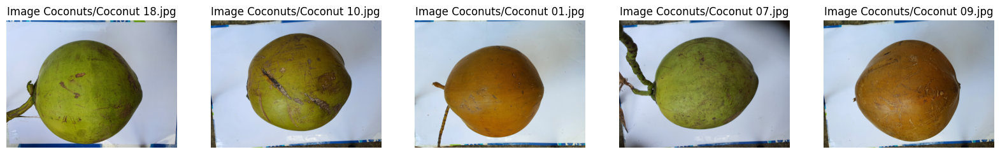

================================================================================ - Finish: ShowRandomImage


In [20]:
FileNameList, ImageList = ShowRandomImage(DatasetFiles, seedNo = 30)

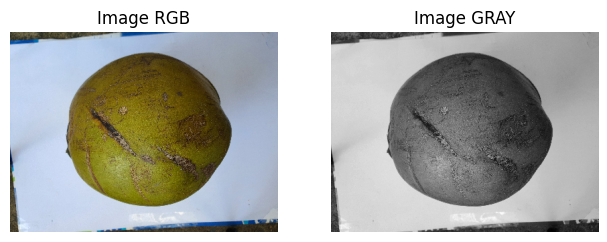

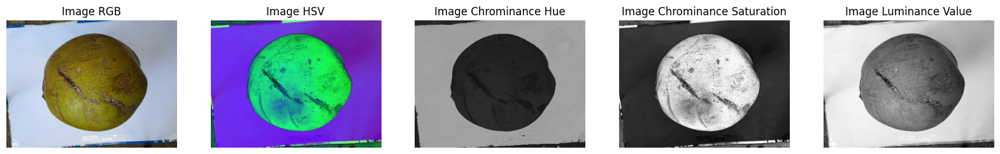

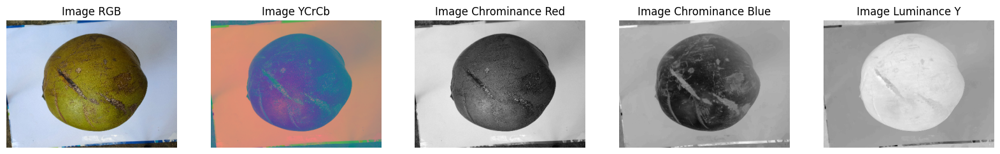

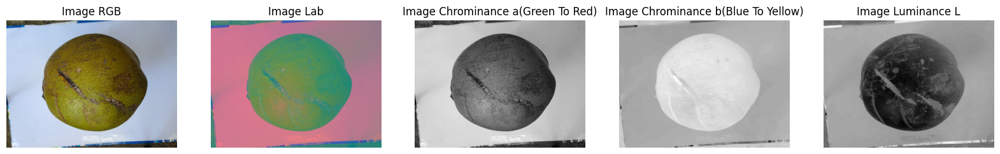

In [21]:
AnImage = ResizeImage(ImageList[1], 0, 300)
image_gray = ConvertColorSpaces(AnImage, ColorSpace = "GRAY")
image_hsv = ConvertColorSpaces(AnImage, ColorSpace = "HSV")
image_ycrcb = ConvertColorSpaces(AnImage, ColorSpace = "YCrCb")
image_lab = ConvertColorSpaces(AnImage, ColorSpace = "Lab")

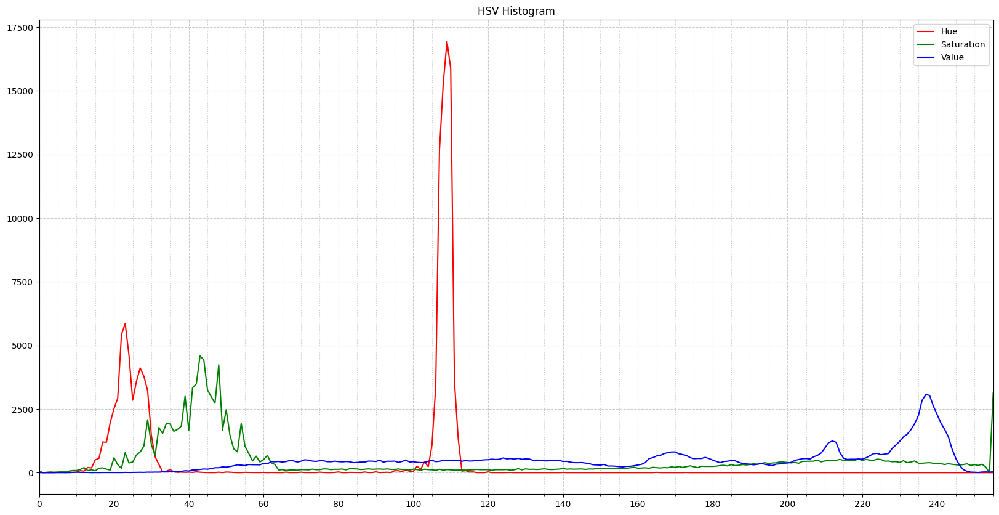

In [22]:
ShowHistogram(image_hsv, Title = "HSV Histogram", ChannelList = ["Hue", "Saturation", "Value"])

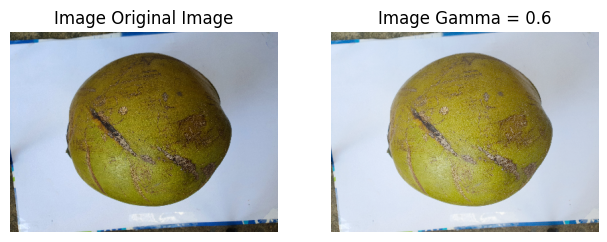

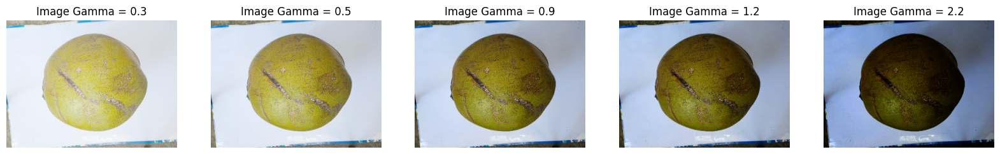

In [23]:
AnImage_Gamma = IntensityTransformation(AnImage, gamma = 0.6, display = 1)

In [24]:
hue = image_hsv[:,:,0]
saturation = image_hsv[:,:,1]
value = image_hsv[:,:,2]

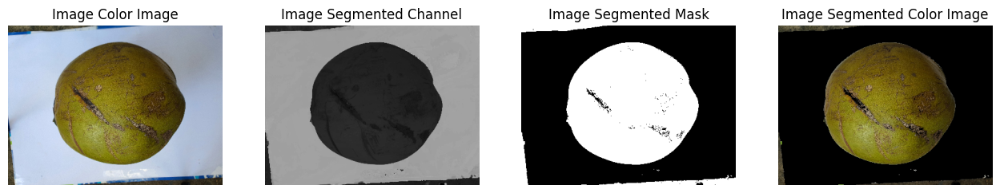

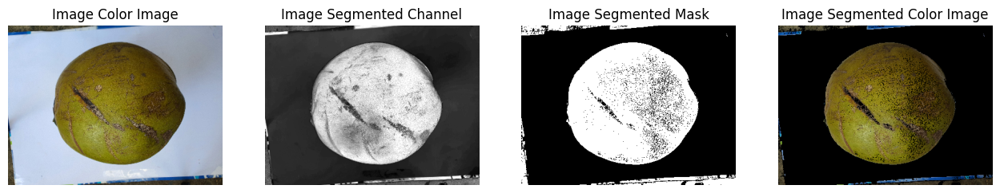

In [25]:
image_mask_bythresh1 = SegmentByThresh(AnImage, hue, segment_range = [14, 45])
image_mask_bythresh2 = SegmentByThresh(AnImage, saturation, segment_range = [70, 255])

Otsu Threshold : 66.0


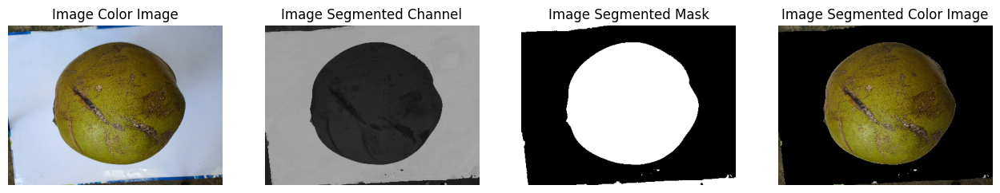

Otsu Threshold : 126.0


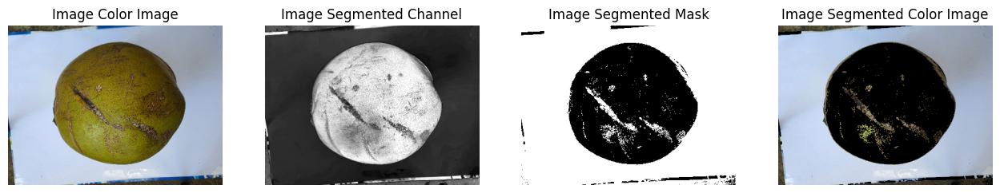

In [26]:
image_mask_byauto1 = SegmentByThresh(AnImage, image_hsv[:,:,0])
image_mask_byauto2 = SegmentByThresh(AnImage, image_hsv[:,:,1])

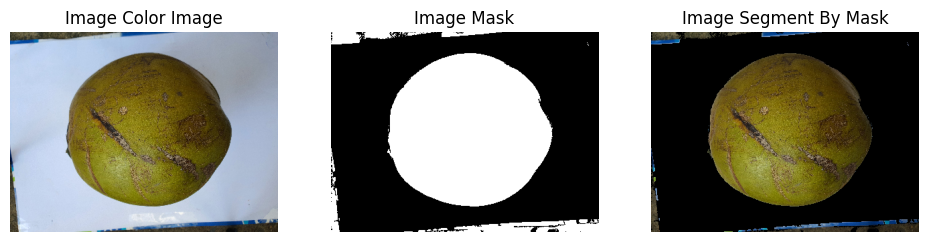

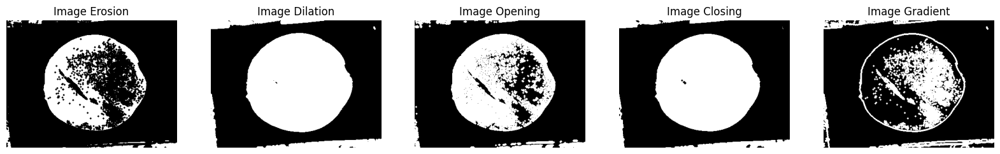

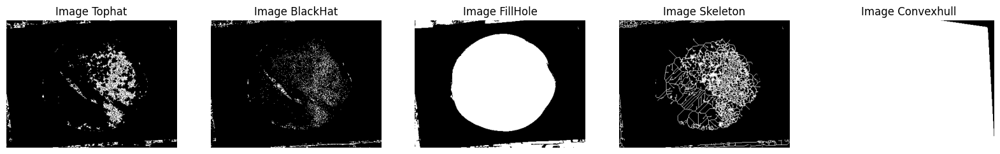

In [27]:
image_mask_bythresh = image_mask_bythresh2.copy()
image_mask_adjust = Morphology(AnImage, image_mask_bythresh, morType = "fillhole", size = 2, display = 1)

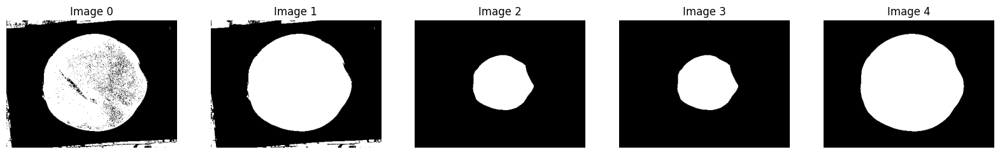

In [30]:
image_mask_adjust = doCoconutMaskSegment2(AnImage, image_mask_bythresh, display = 1)

Already Save Results to Folder Coconuts (Output)
Coconuts (Output)/Coconut 18_rgbmask.jpg
Coconuts (Output)/Coconut 18_demo.jpg


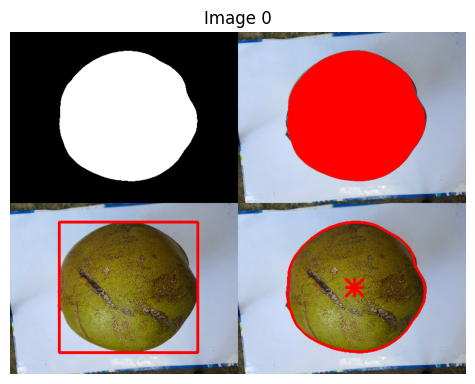

In [32]:
FolderPath = "/Users/mac/Documents/Computer Vision/Traditional"
image_mask = image_mask_adjust.copy()
result = GenerateOutput(AnImage, image_mask, FilePath = FileNameList[0], SaveFolderPath = "Coconuts (Output)")
(image_output_rgbmask, image_output_fill, image_output_bbox, image_output_boundary, DemoImage) = result

ShowImage([DemoImage], 1, 3)

================================================================================ Process Image : Coconuts/Coconut 01.jpg
Already Save Results to Folder Coconuts (Output)
Coconuts (Output)/Coconut 01_rgbmask.jpg
Coconuts (Output)/Coconut 01_demo.jpg


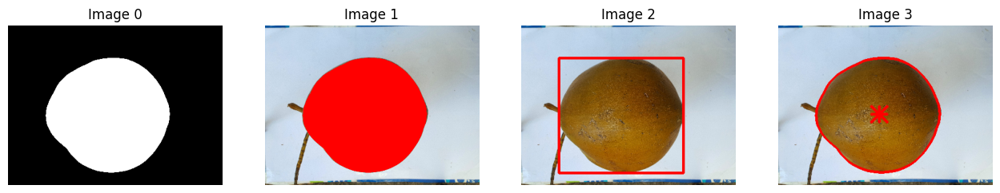

================================================================================ Process Image : Coconuts/Coconut 02.jpg
Already Save Results to Folder Coconuts (Output)
Coconuts (Output)/Coconut 02_rgbmask.jpg
Coconuts (Output)/Coconut 02_demo.jpg


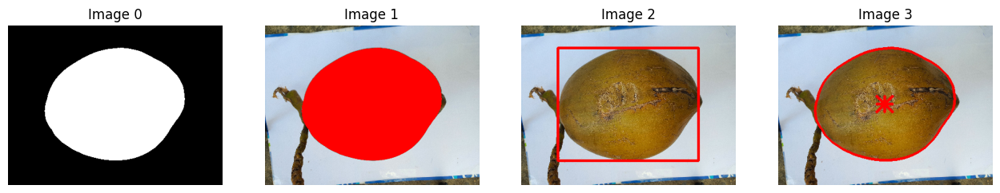

================================================================================ Process Image : Coconuts/Coconut 03.jpg
Already Save Results to Folder Coconuts (Output)
Coconuts (Output)/Coconut 03_rgbmask.jpg
Coconuts (Output)/Coconut 03_demo.jpg


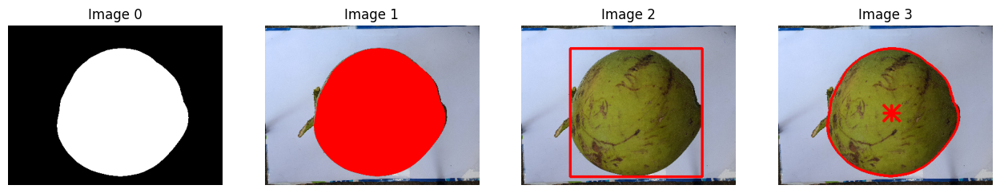

================================================================================ Process Image : Coconuts/Coconut 04.jpg
Already Save Results to Folder Coconuts (Output)
Coconuts (Output)/Coconut 04_rgbmask.jpg
Coconuts (Output)/Coconut 04_demo.jpg


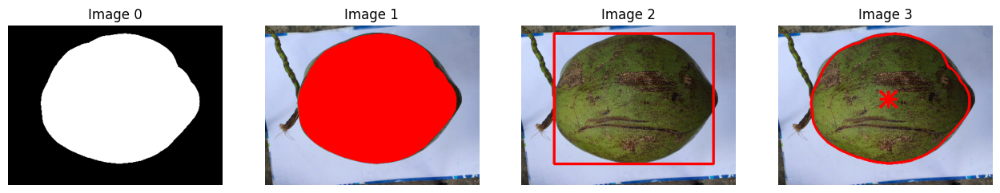

================================================================================ Process Image : Coconuts/Coconut 05.jpg
Already Save Results to Folder Coconuts (Output)
Coconuts (Output)/Coconut 05_rgbmask.jpg
Coconuts (Output)/Coconut 05_demo.jpg


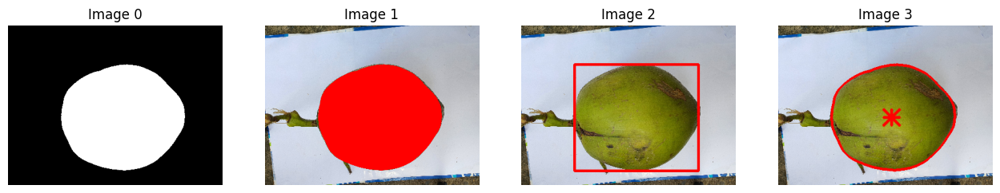

================================================================================ Process Image : Coconuts/Coconut 06.jpg
Already Save Results to Folder Coconuts (Output)
Coconuts (Output)/Coconut 06_rgbmask.jpg
Coconuts (Output)/Coconut 06_demo.jpg


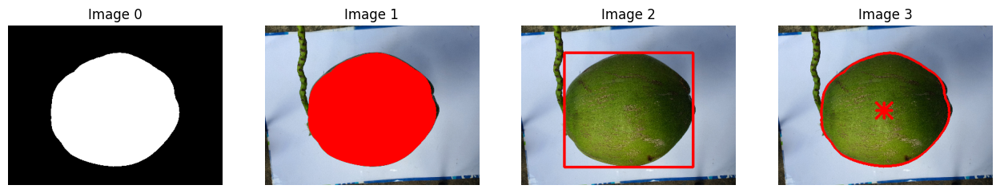

================================================================================ Process Image : Coconuts/Coconut 07.jpg
Already Save Results to Folder Coconuts (Output)
Coconuts (Output)/Coconut 07_rgbmask.jpg
Coconuts (Output)/Coconut 07_demo.jpg


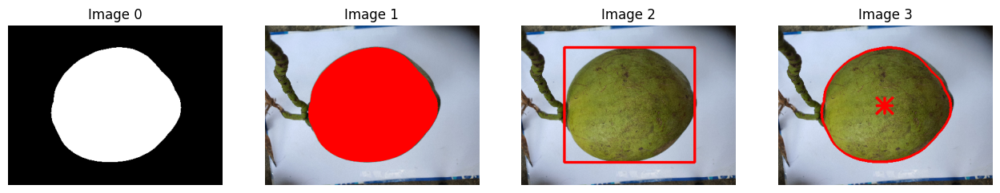

================================================================================ Process Image : Coconuts/Coconut 08.jpg
Already Save Results to Folder Coconuts (Output)
Coconuts (Output)/Coconut 08_rgbmask.jpg
Coconuts (Output)/Coconut 08_demo.jpg


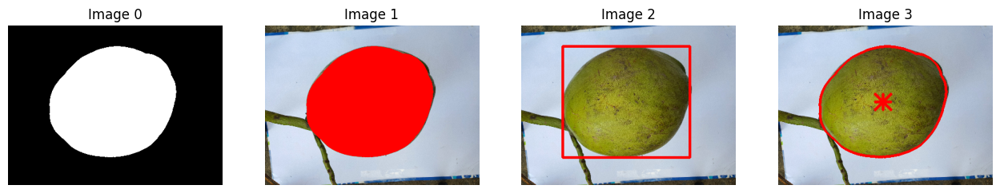

================================================================================ Process Image : Coconuts/Coconut 09.jpg
Already Save Results to Folder Coconuts (Output)
Coconuts (Output)/Coconut 09_rgbmask.jpg
Coconuts (Output)/Coconut 09_demo.jpg


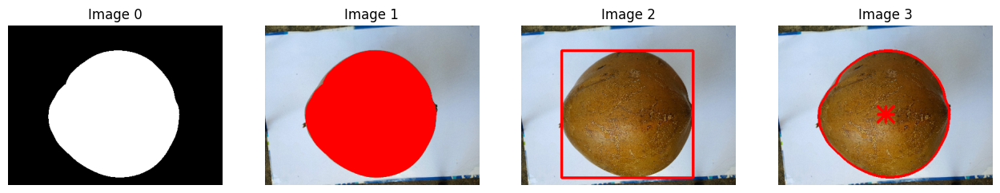

================================================================================ Process Image : Coconuts/Coconut 10.jpg
Already Save Results to Folder Coconuts (Output)
Coconuts (Output)/Coconut 10_rgbmask.jpg
Coconuts (Output)/Coconut 10_demo.jpg


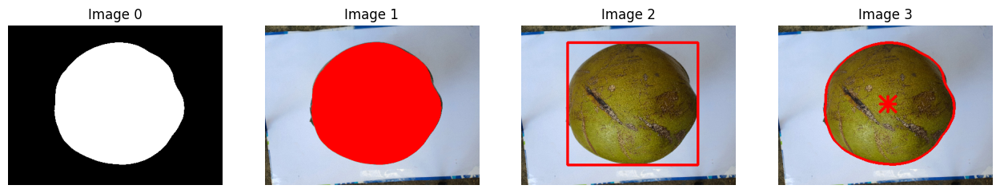

================================================================================ Process Image : Coconuts/Coconut 11.jpg
Already Save Results to Folder Coconuts (Output)
Coconuts (Output)/Coconut 11_rgbmask.jpg
Coconuts (Output)/Coconut 11_demo.jpg


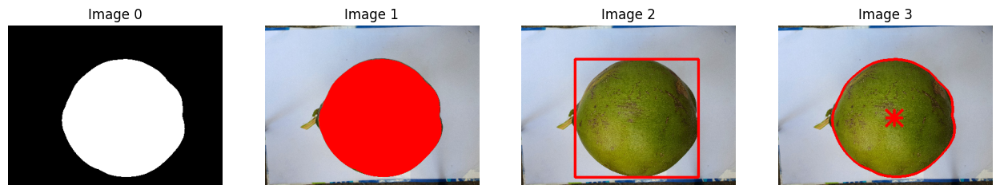

================================================================================ Process Image : Coconuts/Coconut 12.jpg
Already Save Results to Folder Coconuts (Output)
Coconuts (Output)/Coconut 12_rgbmask.jpg
Coconuts (Output)/Coconut 12_demo.jpg


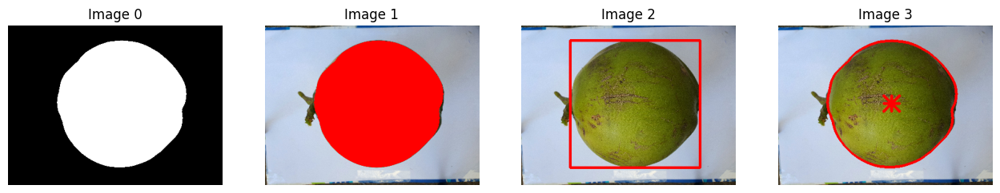

================================================================================ Process Image : Coconuts/Coconut 13.jpg
Already Save Results to Folder Coconuts (Output)
Coconuts (Output)/Coconut 13_rgbmask.jpg
Coconuts (Output)/Coconut 13_demo.jpg


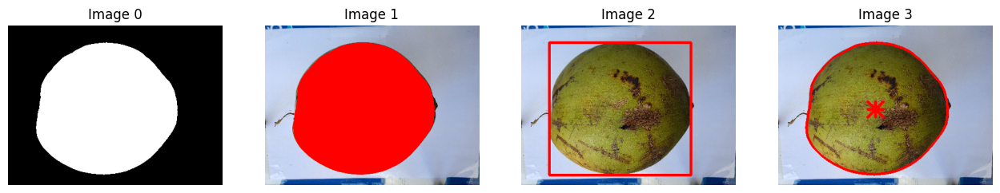

================================================================================ Process Image : Coconuts/Coconut 14.jpg
Already Save Results to Folder Coconuts (Output)
Coconuts (Output)/Coconut 14_rgbmask.jpg
Coconuts (Output)/Coconut 14_demo.jpg


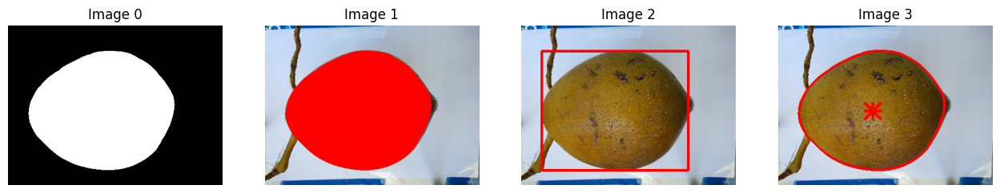

================================================================================ Process Image : Coconuts/Coconut 15.jpg
Already Save Results to Folder Coconuts (Output)
Coconuts (Output)/Coconut 15_rgbmask.jpg
Coconuts (Output)/Coconut 15_demo.jpg


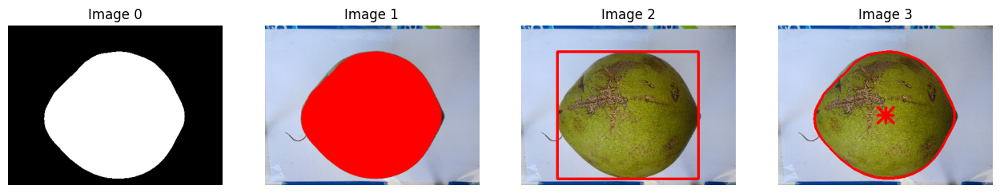

================================================================================ Process Image : Coconuts/Coconut 16.jpg
Already Save Results to Folder Coconuts (Output)
Coconuts (Output)/Coconut 16_rgbmask.jpg
Coconuts (Output)/Coconut 16_demo.jpg


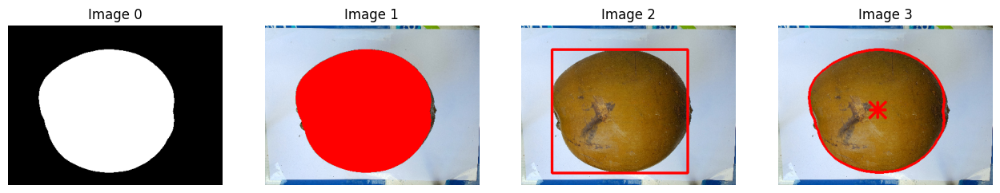

================================================================================ Process Image : Coconuts/Coconut 17.jpg
Already Save Results to Folder Coconuts (Output)
Coconuts (Output)/Coconut 17_rgbmask.jpg
Coconuts (Output)/Coconut 17_demo.jpg


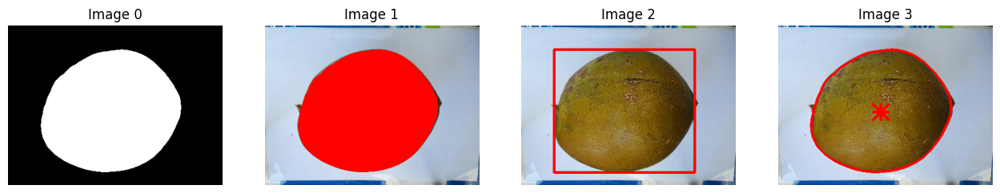

================================================================================ Process Image : Coconuts/Coconut 18.jpg
Already Save Results to Folder Coconuts (Output)
Coconuts (Output)/Coconut 18_rgbmask.jpg
Coconuts (Output)/Coconut 18_demo.jpg


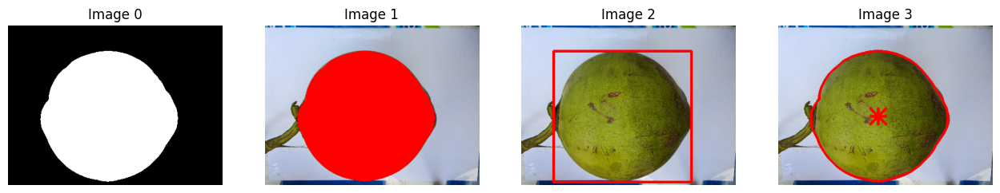

================================================================================ Process Image : Coconuts/Coconut 19.jpg
Already Save Results to Folder Coconuts (Output)
Coconuts (Output)/Coconut 19_rgbmask.jpg
Coconuts (Output)/Coconut 19_demo.jpg


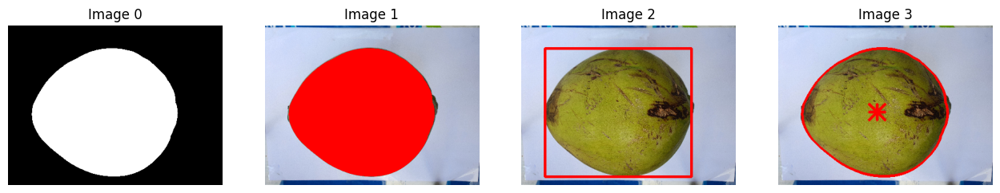

================================================================================ Process Image : Coconuts/Coconut 20.jpg
Already Save Results to Folder Coconuts (Output)
Coconuts (Output)/Coconut 20_rgbmask.jpg
Coconuts (Output)/Coconut 20_demo.jpg


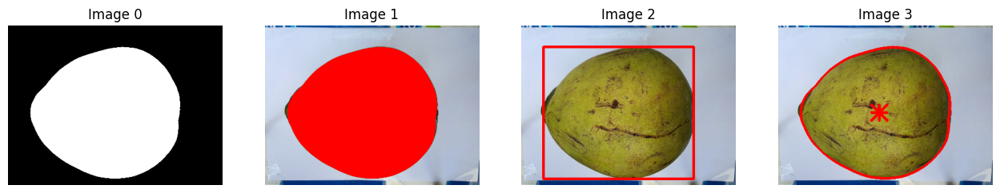

In [52]:
for filepath in DatasetFiles:
    print("=" * 80, f"Process Image : {filepath}")
    AnImage = imread(filepath)
    AnImage = ResizeImage(AnImage, 0, 300)
    image_hsv = ConvertColorSpaces(AnImage, ColorSpace = "HSV", display = 0)

    hue = image_hsv[:,:,0]
    saturation = image_hsv[:,:,1]
    value = image_hsv[:,:,2]
    image_mask_bythresh = SegmentByThresh(AnImage, saturation, segment_range = [70, 255], display = 0)
    image_mask_adjust = doCoconutMaskSegment2(AnImage, image_mask_bythresh, display = 0)
    result = GenerateOutput(AnImage, image_mask_adjust, FilePath = filepath, SaveFolderPath = "Coconuts (Output)")
    (image_output_rgbmask, image_output_fill, image_output_bbox, image_output_boundary, DemoImage) = result

    ShowImage([image_output_rgbmask, image_output_fill, image_output_bbox, image_output_boundary], 1, 5)

# Feature extraction

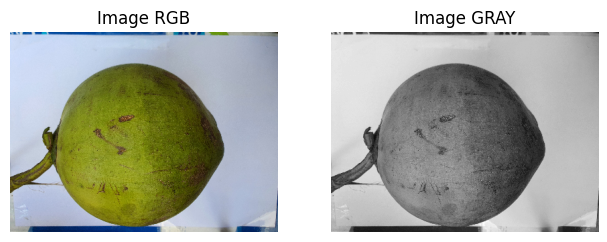

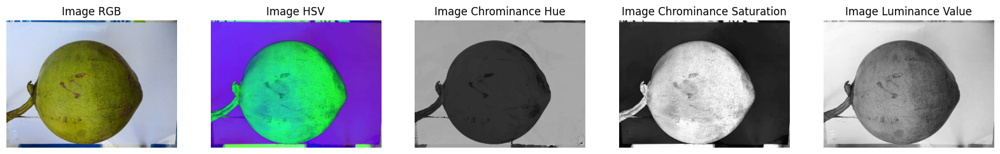

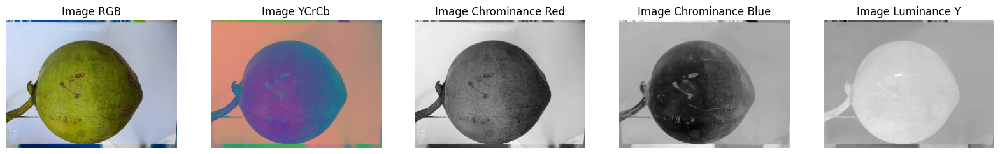

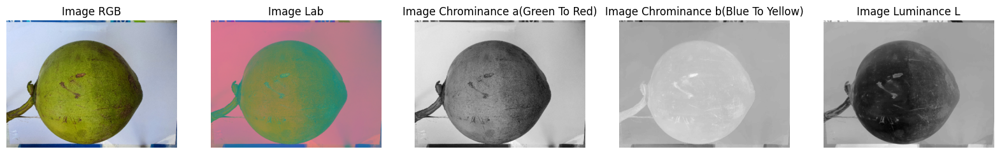

In [42]:
Idx = 0
filename = Path(FileNameList[Idx]).stem
print(f"Here is the image {FileNameList[Idx]}")
AnImage = ResizeImage(ImageList[Idx], 0, 300)
image_gray = ConvertColorSpaces(AnImage, ColorSpace = "GRAY")
image_hsv = ConvertColorSpaces(AnImage, ColorSpace = "HSV")
image_ycrcb = ConvertColorSpaces(AnImage, ColorSpace = "YCrCb")
image_lab = ConvertColorSpaces(AnImage, ColorSpace = "Lab")

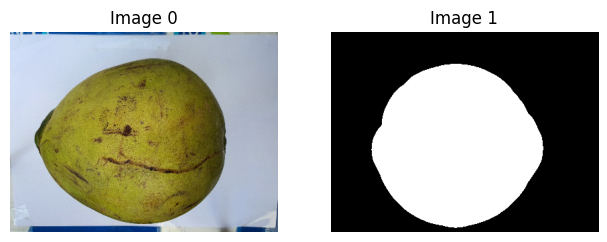

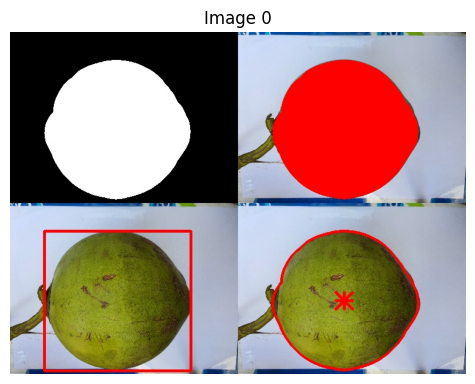

In [53]:
filename = Path(FileNameList[Idx]).stem
image_mask = imread("Coconuts (Output)/" + filename + "_mask.jpg") 
image_mask = image_mask[:,:,0] > 200
image_demo = imread("Coconuts (Output)/" + filename + "_demo.jpg")
ShowImage([AnImage, image_mask], 1, 5)
ShowImage([image_demo], 1, 3)

In [54]:
hue = image_hsv[:,:,0]
saturation = image_hsv[:,:,1]
value = image_hsv[:,:,2]

Center Point at X = 188 and Y = 167
Contours Points are 
 [[185  62]
 [184  63]
 [183  63]
 ...
 [188  62]
 [187  62]
 [186  62]]


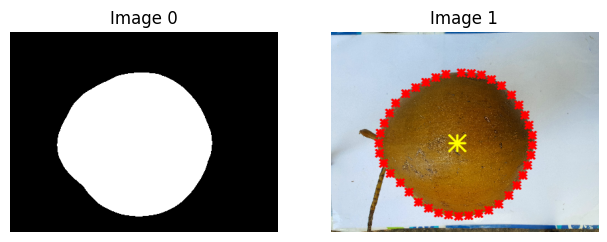

In [60]:
CenterPoints, ContourPoints = GetContourCenter(AnImage, image_mask, display = 1)

Minor Length = 212.05404400748515 and Major Length = 225.1380291576107 and Orientation = 1.4804235877351657
Bounding Box minr, minc, maxr, maxc are : [62, 70, 277, 302]


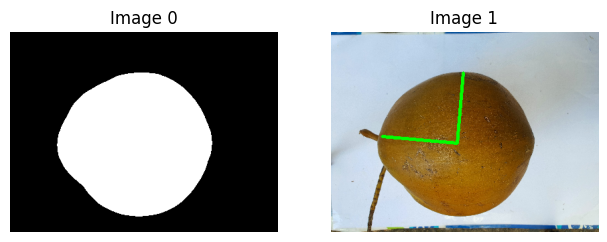

In [61]:
minorLength, majorLength, orientation, bbox = GetMinorMajorLength(AnImage, image_mask, display = 1)

In [48]:
Area, Perimeter, Solidity, Roundness = GetAreaPerimeterSolidity(AnImage, image_mask, display = 1)

Area : 42951, Perimeter : 777, Solidity : 0.992100339546809, Roundness : 0.8940073845340225


In [49]:
result_hue = GetMinMaxMeanQuantileIntensity(AnImage, image_mask, hue, display = 1)
(IntensityMinHue, IntensityMaxHue, IntensityMeanHue, IntensityQ1Hue, IntensityQ2Hue, IntensityQ3Hue) = result_hue

Min : 6.0, Max : 140.0 , Mean : 39.31979751586914
Q1 : 31.0, Q2 : 32.0, Q3 : 33.0


In [50]:
result_saturation = GetMinMaxMeanQuantileIntensity(AnImage, image_mask, saturation, display = 1)
(IntensityMinSaturation, IntensityMaxSaturation, IntensityMeanSaturation, IntensityQ1Saturation, IntensityQ2Saturation, IntensityQ3Saturation) = result_saturation

Min : 3.0, Max : 255.0 , Mean : 186.60830688476562
Q1 : 176.0, Q2 : 206.0, Q3 : 229.0


In [51]:
result_value = GetMinMaxMeanQuantileIntensity(AnImage, image_mask, value, display = 1)
(IntensityMinValue, IntensityMaxValue, IntensityMeanValue, IntensityQ1Value, IntensityQ2Value, IntensityQ3Value) = result_value

Min : 5.0, Max : 228.0 , Mean : 119.70687866210938
Q1 : 86.0, Q2 : 120.0, Q3 : 149.0


In [64]:
for filepath in DatasetFiles:
    print("=" * 80, f"Process Image : {filepath}")
    AnImage = imread(filepath)
    AnImage = ResizeImage(AnImage, 0, 300)

    image_gray = ConvertColorSpaces(AnImage, ColorSpace = "GRAY", display = 0)
    image_hsv = ConvertColorSpaces(AnImage, ColorSpace = "HSV", display = 0)

    filename = Path(filepath).stem
    image_mask = imread("Coconuts (Output)/" + filename + "_mask.jpg") 
    image_mask = image_mask[:,:,0] > 200

    hue = image_hsv[:,:,0]
    saturation = image_hsv[:,:,1]
    value = image_hsv[:,:,2]

    VisualFeatureDict = {}

    CenterPoints, ContourPoints = GetContourCenter(AnImage, image_mask, display = 0)
    minorLength, majorLength, orientation, bbox = GetMinorMajorLength(AnImage, image_mask, display = 0)
    Area, Perimeter, Solidity, Roundness = GetAreaPerimeterSolidity(AnImage, image_mask, display = 0)

    result_hue = GetMinMaxMeanQuantileIntensity(AnImage, image_mask, hue, display = 0)
    (IntensityMinHue, IntensityMaxHue, IntensityMeanHue, IntensityQ1Hue, IntensityQ2Hue, IntensityQ3Hue) = result_hue
    result_saturation = GetMinMaxMeanQuantileIntensity(AnImage, image_mask, saturation, display = 0)
    (IntensityMinSaturation, IntensityMaxSaturation, IntensityMeanSaturation, IntensityQ1Saturation, IntensityQ2Saturation, IntensityQ3Saturation) = result_saturation
    result_value = GetMinMaxMeanQuantileIntensity(AnImage, image_mask, value, display = 0)
    (IntensityMinValue, IntensityMaxValue, IntensityMeanValue, IntensityQ1Value, IntensityQ2Value, IntensityQ3Value) = result_value

    VisualFeatureDict["FileName"] = str(filename)
    VisualFeatureDict["CenterPoints"] = str(CenterPoints)
    VisualFeatureDict["ContourPoints"] = str(ContourPoints)
    VisualFeatureDict["minorLength"] = str(minorLength)
    VisualFeatureDict["majorLength"] = str(majorLength)
    VisualFeatureDict["orientation"] = str(orientation)
    VisualFeatureDict["bbox"] = str(bbox)
    VisualFeatureDict["Area"] = str(Area)
    VisualFeatureDict["Perimeter"] = str(Perimeter)
    VisualFeatureDict["Solidity"] = str(Solidity)
    VisualFeatureDict["Roundness"] = str(Roundness)
    VisualFeatureDict["IntensityMinHue"] = str(IntensityMinHue)
    VisualFeatureDict["IntensityMaxHue"] = str(IntensityMaxHue)
    VisualFeatureDict["IntensityMeanHue"] = str(IntensityMeanHue)
    VisualFeatureDict["IntensityQ1Hue"] = str(IntensityQ1Hue)
    VisualFeatureDict["IntensityQ2Hue"] = str(IntensityQ2Hue)
    VisualFeatureDict["IntensityQ3Hue"] = str(IntensityQ3Hue)
    VisualFeatureDict["IntensityMinSaturation"] = str(IntensityMinSaturation)
    VisualFeatureDict["IntensityMaxSaturation"] = str(IntensityMaxSaturation)
    VisualFeatureDict["IntensityMeanSaturation"] = str(IntensityMeanSaturation)
    VisualFeatureDict["IntensityQ1Saturation"] = str(IntensityQ1Saturation)
    VisualFeatureDict["IntensityQ2Saturation"] = str(IntensityQ2Saturation)
    VisualFeatureDict["IntensityQ3Saturation"] = str(IntensityQ3Saturation)
    VisualFeatureDict["IntensityMinValue"] = str(IntensityMinValue)
    VisualFeatureDict["IntensityMaxValue"] = str(IntensityMaxValue)
    VisualFeatureDict["IntensityMeanValue"] = str(IntensityMeanValue)
    VisualFeatureDict["IntensityQ1Value"] = str(IntensityQ1Value)
    VisualFeatureDict["IntensityQ2Value"] = str(IntensityQ2Value)
    VisualFeatureDict["IntensityQ3Value"] = str(IntensityQ3Value)
  
    WriteJSON(filename, VisualFeatureDict, SaveFolderPath = "Coconuts (Output)")

================================================================================ Process Image : Coconuts/Coconut 01.jpg
Finish Writing to file with contents:  Coconuts (Output)/Coconut 01.json
================================================================================ Process Image : Coconuts/Coconut 02.jpg
Finish Writing to file with contents:  Coconuts (Output)/Coconut 02.json
================================================================================ Process Image : Coconuts/Coconut 03.jpg
Finish Writing to file with contents:  Coconuts (Output)/Coconut 03.json
================================================================================ Process Image : Coconuts/Coconut 04.jpg
Finish Writing to file with contents:  Coconuts (Output)/Coconut 04.json
================================================================================ Process Image : Coconuts/Coconut 05.jpg
Finish Writing to file with contents:  Coconuts (Output)/Coconut 05.json
==============================

In [69]:
fname = f"Coconuts (Output)/{filename}.json"
JsonData = ReadJSON(fname)

Finish Reading fname 



In [70]:
JsonData

{'FileName': 'Coconut 20',
 'CenterPoints': '[188, 164]',
 'ContourPoints': '[[212  41]\n [211  42]\n [210  42]\n ...\n [215  42]\n [214  41]\n [213  42]]',
 'minorLength': '242.72357042461942',
 'majorLength': '276.47456521671364',
 'orientation': '-1.4712102729705783',
 'bbox': '[41, 41, 288, 321]',
 'Area': '52433',
 'Perimeter': '864',
 'Solidity': '0.9940847473694189',
 'Roundness': '0.8826470743616771',
 'IntensityMinHue': '4.0',
 'IntensityMaxHue': '47.0',
 'IntensityMeanHue': '26.443155',
 'IntensityQ1Hue': '26.0',
 'IntensityQ2Hue': '27.0',
 'IntensityQ3Hue': '28.0',
 'IntensityMinSaturation': '55.0',
 'IntensityMaxSaturation': '255.0',
 'IntensityMeanSaturation': '186.79889',
 'IntensityQ1Saturation': '172.0',
 'IntensityQ2Saturation': '188.0',
 'IntensityQ3Saturation': '204.0',
 'IntensityMinValue': '17.0',
 'IntensityMaxValue': '218.0',
 'IntensityMeanValue': '128.50844',
 'IntensityQ1Value': '105.0',
 'IntensityQ2Value': '135.0',
 'IntensityQ3Value': '154.0'}

# Feature description

Len of HoG Feature is 63504 and Values are :
[0.25473512 0.08724462 0.         ... 0.00183056 0.04726783 0.13326006]


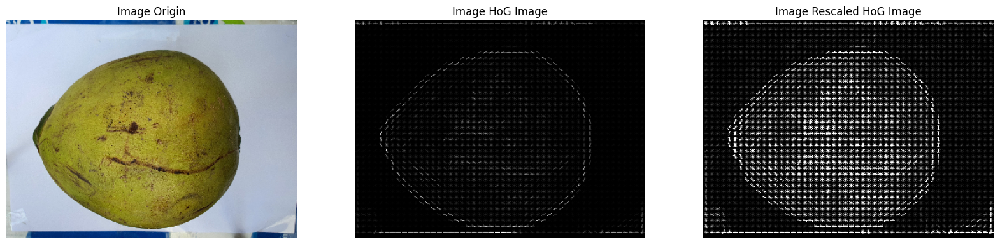

In [81]:
HoGfeature = HogFeatureExtraction(AnImage, display = 1)

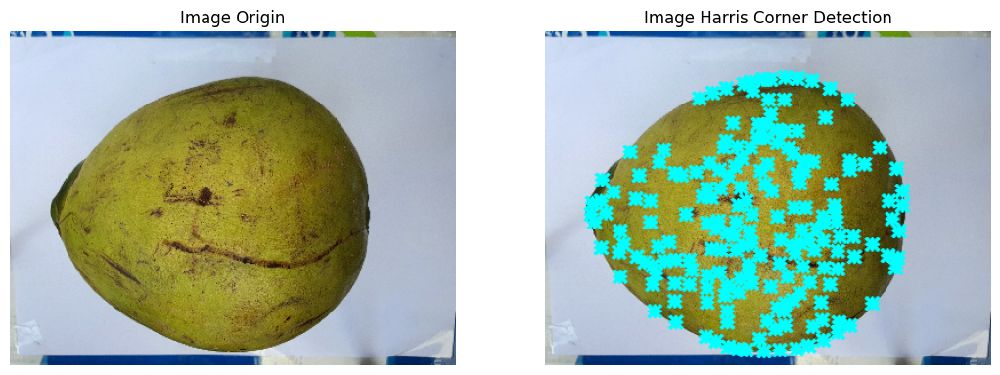

In [82]:
HarriscoordsList = DetectHarisCorner(AnImage, value, image_mask, display = 1)

Original there are 100 ORB features points but only 100 ORB features inside


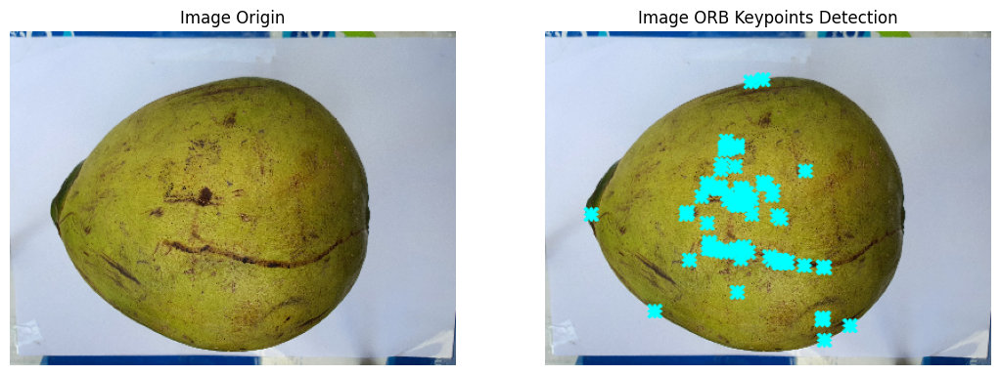

In [83]:
ORBKeyPointsList = DetectORBKeypoints(AnImage, value, image_mask, NumKeypoints = 100, display = 1)

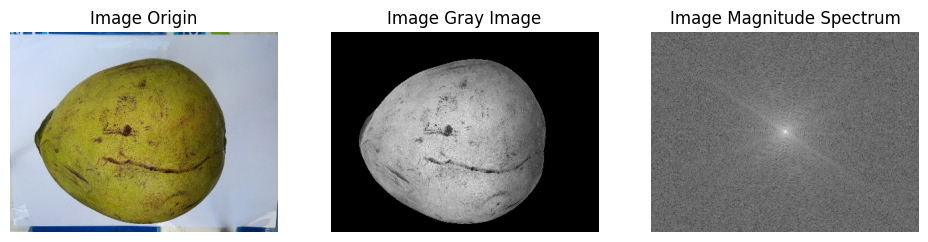

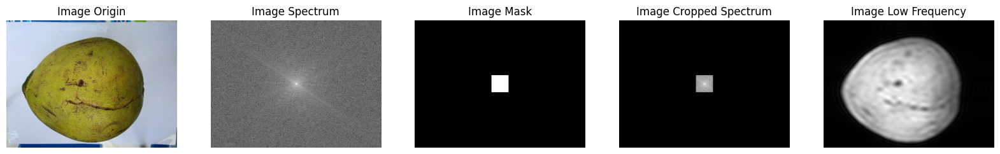

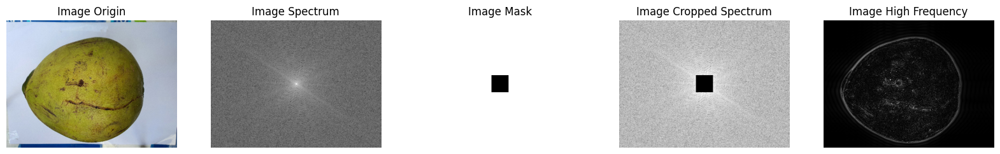

In [84]:
magnitude_spectrum, dft_shift = DFT_Transformation(AnImage, value, display = 1)
image_inverse_LowFeq, image_inverse_HiFeq = DFT_Seperation(AnImage, magnitude_spectrum, dft_shift , maskSize = 20, display = 1)

# Image segmentation

P-Tile Theshold :  0


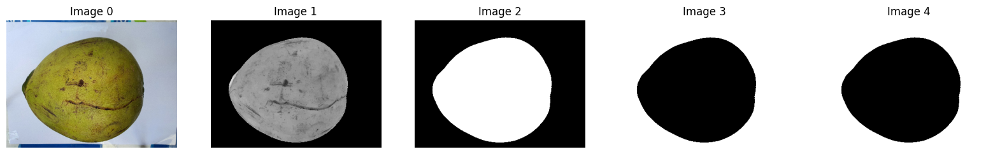

In [88]:
image_value = hue.copy()
T = p_tile_threshold(image_value, pct = 0.4)
print("P-Tile Theshold : ", T)

image_class1 = image_value > T
image_class2 = image_value <= T
image_object = GetLargestBinaryArea(AnImage, image_class2, display = 0)
ShowImage([AnImage, image_value, image_class1, image_class2, image_object], 1, 5)

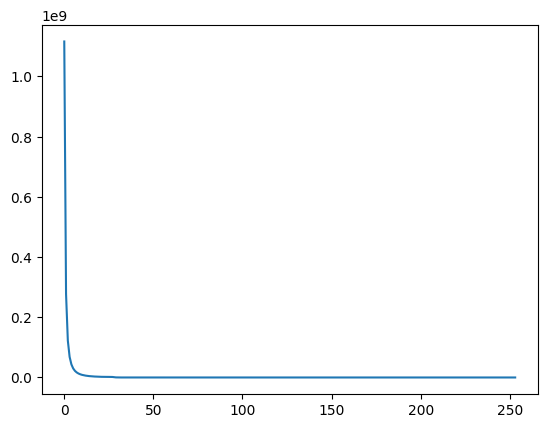

Otsu Threshold : 1


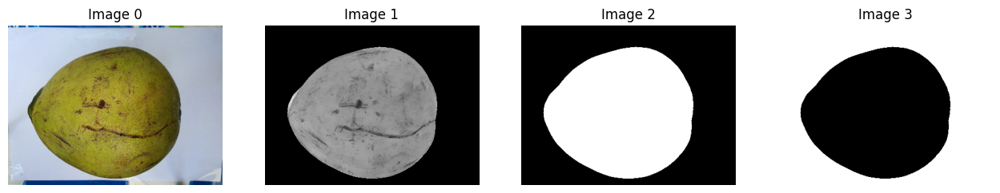

In [89]:
image_value = hue.copy()
otsu_segment, otsu_thresh, parms = otsu(image_value)
WBackground, WForeground, Values = parms[0], parms[1], parms[2]
plt.plot(Values)
plt.show()
print("Otsu Threshold :", otsu_thresh)
image_object = 255 - otsu_segment
ShowImage([AnImage, image_value, otsu_segment, image_object], 1, 5)

Minimum error Thresholding : 4


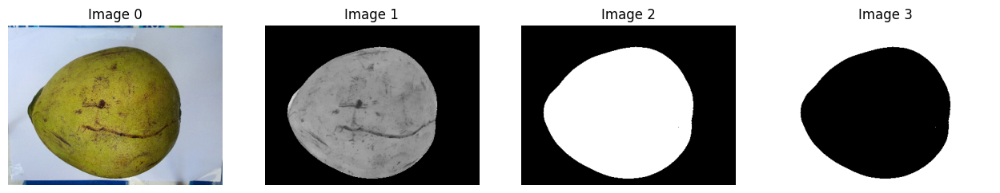

In [90]:
image_value = hue.copy()
segment_img, segment_thresh = min_err_threshold(image_value)
print("Minimum error Thresholding :", segment_thresh)
image_object = 255 - segment_img
ShowImage([AnImage, image_value, segment_img, image_object], 1, 5)

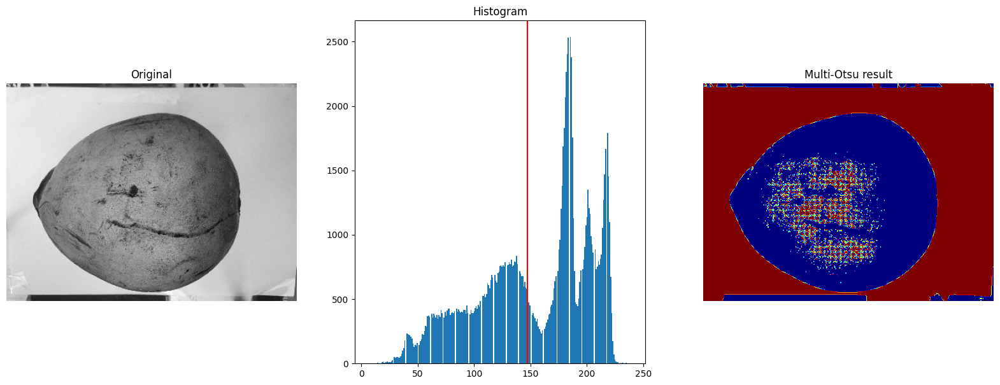

In [91]:
from skimage.filters import threshold_multiotsu
# Applying multi-Otsu threshold for the default value, generating
# two classes.
thresholds = threshold_multiotsu(image_gray, classes = 2)
# Using the threshold values, we generate the three regions.
regions = np.digitize(image_gray, bins=thresholds)

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 7))
# Plotting the original image.
ax[0].imshow(image_gray, cmap='gray')
ax[0].set_title('Original')
ax[0].axis('off')
# Plotting the histogram and the two thresholds obtained from
# multi-Otsu.
ax[1].hist(image_gray.ravel(), bins=255)
ax[1].set_title('Histogram')
for thresh in thresholds:
    ax[1].axvline(thresh, color='r')
# Plotting the Multi Otsu result.
ax[2].imshow(regions, cmap='jet')
ax[2].set_title('Multi-Otsu result')
ax[2].axis('off')
plt.subplots_adjust()
plt.show()

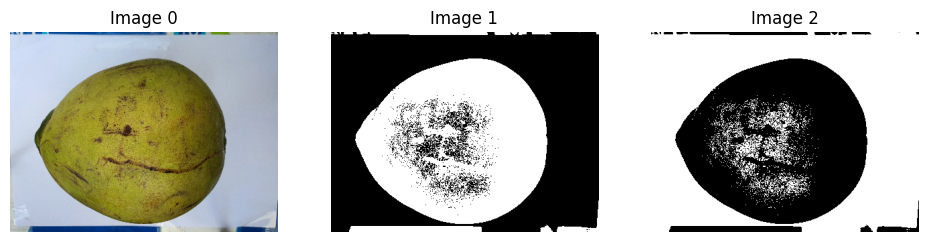

In [92]:
Segments = []

for idx in list(np.unique(regions)):
    mask = regions == idx
    Segments.append(mask)

ShowImage([AnImage] + Segments, 1, len(Segments) + 3)

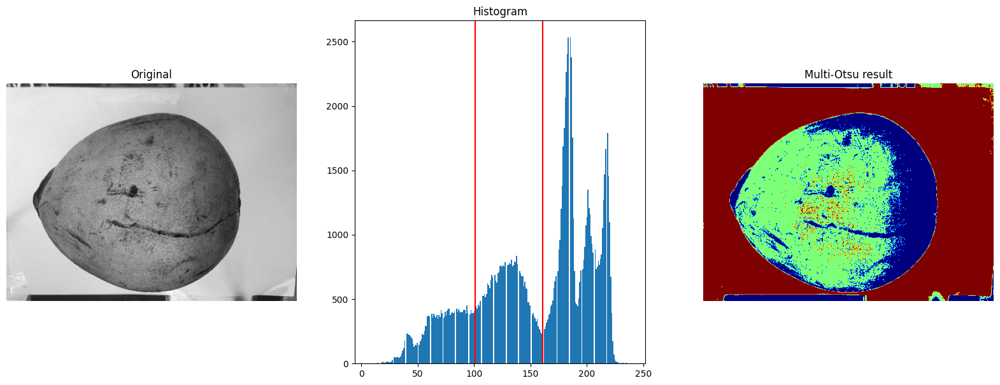

In [93]:
thresholds = threshold_multiotsu(image_gray, classes = 3)
regions = np.digitize(image_gray, bins=thresholds)

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 7))
ax[0].imshow(image_gray, cmap='gray')
ax[0].set_title('Original')
ax[0].axis('off')
ax[1].hist(image_gray.ravel(), bins=255)
ax[1].set_title('Histogram')
for thresh in thresholds:
    ax[1].axvline(thresh, color='r')
ax[2].imshow(regions, cmap='jet')
ax[2].set_title('Multi-Otsu result')
ax[2].axis('off')
plt.subplots_adjust()
plt.show()

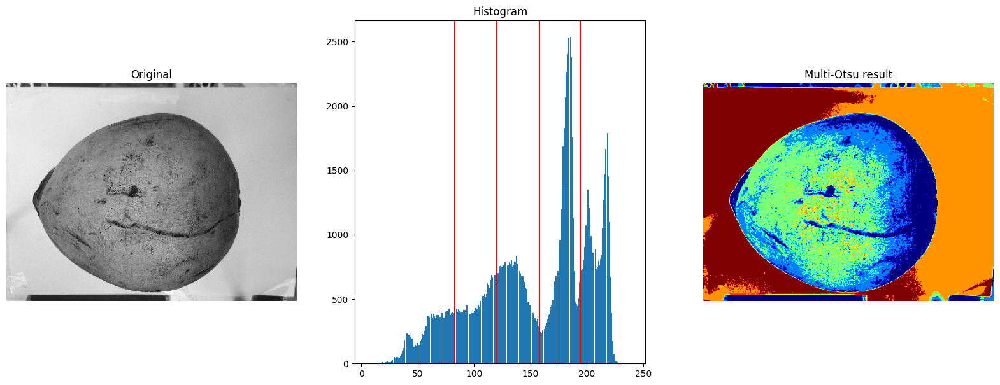

In [94]:
thresholds = threshold_multiotsu(image_gray, classes = 5)
regions = np.digitize(image_gray, bins=thresholds)

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 7))
ax[0].imshow(image_gray, cmap='gray')
ax[0].set_title('Original')
ax[0].axis('off')
ax[1].hist(image_gray.ravel(), bins=255)
ax[1].set_title('Histogram')
for thresh in thresholds:
    ax[1].axvline(thresh, color='r')
ax[2].imshow(regions, cmap='jet')
ax[2].set_title('Multi-Otsu result')
ax[2].axis('off')
plt.subplots_adjust()
plt.show()

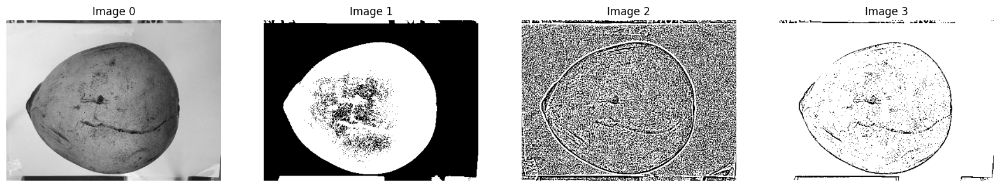

In [95]:
from skimage.filters import (threshold_otsu, threshold_niblack, threshold_sauvola)
image = image_gray
binary_global = image > threshold_otsu(image)

window_size = 5
thresh_niblack = threshold_niblack(image, window_size=window_size, k=0.1)
thresh_sauvola = threshold_sauvola(image, window_size=window_size)

binary_niblack = image > thresh_niblack
binary_sauvola = image > thresh_sauvola

ShowImage([image, 255 - binary_global, binary_niblack, binary_sauvola], 1, 4)

In [96]:
img = AnImage.copy()
vectorized = img.reshape((-1,3))
vectorized = np.float32(vectorized)

In [97]:
K = 2
attempts=10
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
ret,label,center=cv2.kmeans(vectorized,K,None,criteria,attempts,cv2.KMEANS_PP_CENTERS)

In [98]:
center = np.uint8(center)
res = center[label.flatten()]
result_label = label.reshape((img.shape[:2]))
result_image = res.reshape((img.shape))

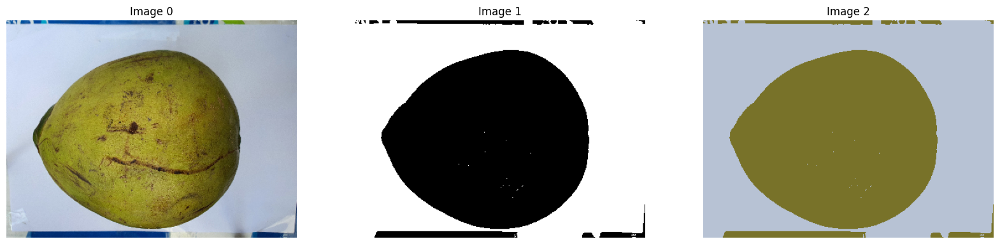

(300, 400, 3)


In [99]:
ShowImage([img, result_label, result_image], 1, 3)
print(img.shape)